# Zarifs Mini-project Detecting the anomalous activity of a ship’s engine

**My first mini-project: Detecting the anomalous activity of a ship’s engine! - *Unsupervised Anomaly Detection (No Ground Truth)***

Background context:

A poorly maintained ship engine in the supply chain industry can lead to inefficiencies, increased fuel consumption, higher risks of malfunctions, and potential safety hazards. **The challenge in this project is to apply critical thinking and ML concepts to design and implement a robust anomaly detection model.**

Estimated time for project is **12 hours**.
<br></br>

## **Business context**
A real data set is used to identify anomalous activity in a ship’s engine functionality (Devabrat,  2022). Typically speaking, anomalies would make up a minority of the data points (i.e., about 1% to 5% of the data points would be anomalies) so this should be factored in.

The data set contains six important features continuously monitored to evaluate the engine's status as ‘good’ or ‘bad’. These features are:

- **Engine rpm (revolutions per minute):** A high rpm indicates the engine is operating at a higher speed than designed for prolonged periods, which can lead to overheating, excessive wear, and eventual failure. A low rpm could signal a lack of power, issues with fuel delivery, or internal mechanical problems.
- **Lubrication oil pressure:** Low lubrication oil pressure indicates insufficient lubrication, leading to increased friction, overheating, and engine damage. A high lubrication oil pressure could signal a blockage in the oil delivery system, potentially causing seal or gasket failure.
- **Fuel pressure:** High fuel pressure can cause poor engine performance and incomplete combustion, indicating fuel pump or filter issues. A low fuel pressure may result in excessive fuel consumption, poor emissions, or damage to the fuel injectors.
- **Coolant pressure:** Low coolant pressure indicates a potential leak in the cooling system or a coolant pump failure, risking engine overheating. A high coolant pressure could be a sign of a blockage in the cooling system or a failing head gasket, which can also lead to overheating.
- **Lubrication oil temperature:** High lubrication oil temperature suggests the oil is overheating, which can degrade its lubricating properties and lead to engine damage. A low lubrication oil temperature may indicate it is not reaching its optimal operating temperature, potentially causing inadequate lubrication.
- **Coolant temperature:** High coolant temperature signals overheating, which various issues, including a failed thermostat, coolant leak, or insufficient coolant flow can cause. A low coolant temperature could suggest the engine is not reaching its optimal operating temperature, affecting performance and efficiency.

Issues with engines could lead to engine malfunctions, potential safety hazards, and downtime (e.g. delayed deliveries), resulting in the breakdown of a ship’s overall functionality, consequently impacting the business, such as affecting revenue via failure to deliver goods. By predicting timely maintenance, the business aims to increase profit by reducing downtime, reducing safety risks for the crew, limiting fuel consumption, and increasing customer satisfaction through timely deliveries.

The main question to consider is:

- What insights can be gained from the data, and what recommendations can be made to the company based on these insights?
- For example, which features need to be monitored closely, and what are the thresholds for anomalous observations?
- Which statistical or ML technique is the best for anomaly detection based on **this data set**, and which feature (univariate approach) or combination of features (multivariate approach) can predict maintenance?
<br>

> **Disclaimer**
>
> Please note that although a real-life data set was provided, the business context in this project is fictitious. Any resemblance to companies and persons (living or dead) is coincidental.
<br>

## **Objective**
To display an understanding of and showcasing my ability to apply statistical and ML methods for detecting anomalies by developing a robust anomaly detection system to protect a company’s shipping fleet by evaluating engine functionality.

High level summary:
- explore the data set
- employ preprocessing and feature engineering
- apply statistical techniques to detect anomalies
- perform ML model training, anomaly detection, post-processing, and refinement.

## **What this project demonstrates**
That I can:
- demonstrate enhanced problem-solving skills and proposed strategic solutions by systematically analysing complex organisational challenges
- identify meaningful patterns in complex data to evidence advanced critical and statistical thinking skills
- select statistical techniques appropriate to a solutions design approach and evidence the ability to evaluate their effectiveness
- demonstrate enhanced data representation and improved model performance by systematically implementing relevant techniques
- design innovative solutions through critically selecting, evaluating and implementing effective unsupervised learning techniques.

# 1. Import the required libraries and data set with the provided URL.


In [1]:
# Standard libraries
import pandas as pd
import numpy as np
import scipy.stats as stats

# Set a random seed
np.random.seed(42)

# Graphing imports
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

# Feature scaling and modelling imports
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import OneClassSVM
from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest

import warnings
warnings.filterwarnings("ignore")

In [2]:
# URL to import data set from GitHub.
url = 'https://raw.githubusercontent.com/fourthrevlxd/cam_dsb/main/engine.csv'

ship_data = pd.read_csv(url)

# 2. Exploratory Data Analysis

Identifying missing or duplicate values.


In [3]:
ship_data.head(3)

,Engine rpm,Lub oil pressure,Fuel pressure,Coolant pressure,lub oil temp,Coolant temp
0,682,2.391656,4.617196,2.848982,76.272417,69.884609
1,605,5.466877,6.424361,5.727520,73.222679,74.907314
2,658,3.434232,3.680896,1.678708,88.089916,78.704806


In [4]:
# change to all lower case
ship_data.columns = map(str.lower, ship_data.columns)
ship_data.head(3)

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp
0,682,2.391656,4.617196,2.848982,76.272417,69.884609
1,605,5.466877,6.424361,5.727520,73.222679,74.907314
2,658,3.434232,3.680896,1.678708,88.089916,78.704806


In [5]:
# Display the first few rows of the DataFrame
print(ship_data.shape)
print(ship_data.info())

(19535, 6)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19535 entries, 0 to 19534
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   engine rpm        19535 non-null  int64  
 1   lub oil pressure  19535 non-null  float64
 2   fuel pressure     19535 non-null  float64
 3   coolant pressure  19535 non-null  float64
 4   lub oil temp      19535 non-null  float64
 5   coolant temp      19535 non-null  float64
dtypes: float64(5), int64(1)
memory usage: 915.8 KB
None


0 missing values as no nulls present. All features are numerical data, though on different scales.

In [6]:
ship_data.isna().sum()

,0
engine rpm,0
lub oil pressure,0
fuel pressure,0
coolant pressure,0
lub oil temp,0
coolant temp,0


In [7]:
# List of columns in the ship_data DataFrame
ship_columns = ['engine rpm', 'lub oil pressure', 'fuel pressure',
           'coolant pressure', 'lub oil temp', 'coolant temp']

# Loop over each column and count duplicates
for col in ship_columns:
    duplicate_count = ship_data.duplicated(subset=[col]).sum()
    print(f"Column '{col}' has {duplicate_count} duplicate values.")

Column 'engine rpm' has 18156 duplicate values.
Column 'lub oil pressure' has 1 duplicate values.
Column 'fuel pressure' has 4 duplicate values.
Column 'coolant pressure' has 1 duplicate values.
Column 'lub oil temp' has 5 duplicate values.
Column 'coolant temp' has 3 duplicate values.


All features contain at least one duplicate value.

Engine rpm has the most duplicates, likey due to the fact it is expressed only to 3sf, while the other features are expressed to 6 decimal places.

In [8]:
ship_data.nunique()

,0
engine rpm,1379
lub oil pressure,19534
fuel pressure,19531
coolant pressure,19534
lub oil temp,19530
coolant temp,19532


# 3. Generate the descriptive statistics of the data, including:
- observing the mean for each feature
- identifying the median
- idenitfying the range values beyond the 95th percentile for at least two features


In [9]:
ship_data.describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95]).applymap(lambda x: '{:.4g}'.format(x))

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp
count,1.954e+04,1.954e+04,1.954e+04,1.954e+04,1.954e+04,1.954e+04
mean,791.2,3.304,6.656,2.335,77.64,78.43
std,267.6,1.022,2.761,1.036,3.111,6.207
min,61,0.003384,0.003187,0.002483,71.32,61.67
5%,443,1.942,3.127,1.084,74.27,68.4
25%,593,2.519,4.917,1.6,75.73,73.9
50%,746,3.162,6.202,2.167,76.82,78.35
75%,934,4.055,7.745,2.849,78.07,82.92
95%,1324,5.058,12.21,4.438,84.94,88.61
max,2239,7.266,21.14,7.479,89.58,195.5


The mean and median values for each feature are reasonably similar, indicating a roughly normal distribution.

The features have different scales e.g enginer rpms mean is in the hundreds, while lub oil,fuel, coolant pressure are in the single digits, so scaling will be necessary.

For all features the means are greater than the medians, indicating a positive skew to the data. This is least apparent in the Coolant temp feature.

The 95th percentile for engine rpm and coolant temp show a considerably lower value than the maximum, suggesting the presence of at least one high value outlier in these feature's data.

The other features, where the maximum and 95% values are closer together may not have such extreme isolated instances of outliers.

In [10]:
ship_columns = ['engine rpm', 'lub oil pressure', 'fuel pressure', 'coolant pressure', 'lub oil temp', 'coolant temp']

percentile_95 = ship_data[ship_columns].quantile(0.95)

# Filter accordingly
beyond_95th_percentile = ship_data[(ship_data[ship_columns] > percentile_95).any(axis=1)]
beyond_95th_percentile

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp
1,605,5.466877,6.424361,5.727520,73.222679,74.907314
2,658,3.434232,3.680896,1.678708,88.089916,78.704806
6,885,2.034509,15.499680,1.522790,78.959645,80.817985
7,576,5.495972,13.114658,1.251058,78.091390,71.934674
9,806,3.946885,21.138326,1.572569,74.923316,72.112692
...,...,...,...,...,...,...
19522,1329,3.588706,6.446181,2.610933,76.126108,76.579361
19523,530,1.968553,4.633428,2.030104,76.022252,90.677190
19528,776,2.518025,5.263035,2.809175,88.146710,85.337935
19529,1581,2.818947,4.519570,0.838869,76.067947,75.448412


In [11]:
#5124/19535

print(len(beyond_95th_percentile)/len(ship_data))

0.26229843869976965


Looks like a lot of data is beyond the 95th percentile, this is quite a lot about 26% of the data, I presume that using a simple IQR method to remove outliers wouldnt turn out so well, as this  project progresses we will compare this method to other approaches.

If all outliers were anomalies that would be 26%, far more than on average which is between 1-5%.

# 4. Visualize the data to determine the distribution and extreme values.

## 4.1 Visualizations

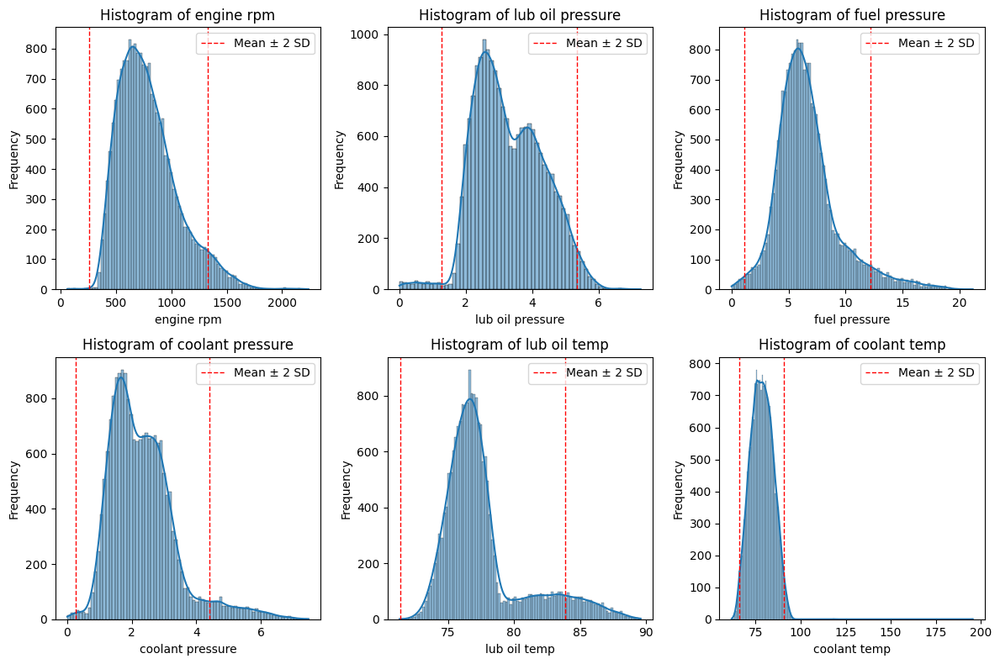

In [12]:
# Assuming 'ship_data' is your DataFrame and 'ship_columns' is your list of column names
fig, axes = plt.subplots(2, 3, figsize=(12, 8))  # 2 rows, 3 columns

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Create individual histograms for each column
for i, column in enumerate(ship_columns):
    sns.histplot(ship_data[column], kde=True, ax=axes[i])
    axes[i].set_title(f'Histogram of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

    # Calculate mean and standard deviation
    mean = ship_data[column].mean()
    stdev = ship_data[column].std()

    # Draw red lines for 2x standard deviations
    axes[i].axvline(mean + 2 * stdev, color='red', linestyle='dashed', linewidth=1, label='Mean ± 2 SD')
    axes[i].axvline(mean - 2 * stdev, color='red', linestyle='dashed', linewidth=1)

    # Add legend
    axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()

Interesting distributions,

* 1/6 (coolant temp) is normally distributed.

* 2/6 are almost normally distributed with a slight skew (engine rpm, fuel pressure),

* 3/6 are not normally distributed with stronger skews or subpopulations indicated by 2 peaks/shoulder (lub oil temp, lub oil pressure, coolant pressure) one would expect there to be lots of anomalies within these features.

Lub oil pressure appears to have both low and high outliers - this can cause critical engine problems

Essentially all features except Coolant temp are skewed distributions with large numbers of data points falling above or below the 95th percentile to one side of the mean.

Standard deviation is therefore not that suitable for anomaly analysis on this data.

In [13]:
print("Percentage difference between mean and median, as a percentage of the mean")
print((((ship_data.mean() - ship_data.median())/ship_data.mean())*100).apply(lambda x: f"{x:.2f}%"))

Percentage difference between mean and median, as a percentage of the mean
engine rpm          5.72%
lub oil pressure    4.29%
fuel pressure       6.82%
coolant pressure    7.21%
lub oil temp        1.06%
coolant temp        0.10%
dtype: object


4/6 have a +ve skew and likely most affected by outliers, 2/6 are marginally +vley skewed. Engine rpm can be added to list of features we expect to be affected by anomalies (all of them except coolant temp)

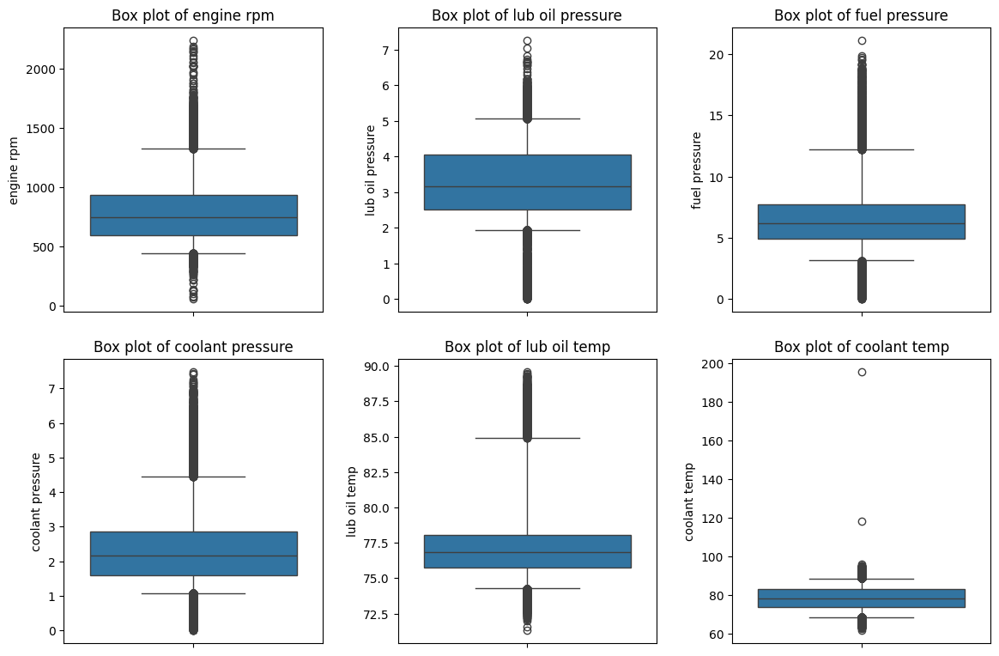

In [14]:
# Create figure with 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate over each column and create a box plot with whiskers at 5% and 95%
for i, column in enumerate(ship_columns):
    sns.boxplot(y=ship_data[column], ax=axes[i], whis=(5, 95))  # Set whiskers to 5% and 95%
    axes[i].set_title(f'Box plot of {column}')
    axes[i].set_ylabel(column)

# Adjust layout
plt.tight_layout(pad=2)
plt.show()

All features have data points below and above the 5th and 95th percentiles respectively, There are very clearly outliers present, e.g. one very high value in coolant temp which is likely an anomaly

## 4.2 Summary

* Features most affected by outliers are: engine rpm, lub oil temp, fuel, lub oil and coolant pressure

* Engine rpm, fuel pressure, coolant pressure and lub oil temp show a lot of values exceeding the upper 95th percentile (+ 2 StDev).

Lub oil pressure shows a lot of values exceeding the lower 95th percentile (- 2 StDev).

All datasets are skewed distributions except Coolant temp, which appears to have a normal distribution (histograms and mean/median comparisons).

However, Coolant temp has one or two very high values that are outliers (identified in boxplots) that could be anomalies.

Therefore, all features should be assessed for anomalies.

Methods assuming normal distribution such as standard deviation (shown above) or Z-score are not suitable for the majority of features.

Both Lub oil pressure and Coolant pressure exhibit a shoulder in their distribution peaks (may also be present in lub oil temp), suggesting there are two standard values each measure can take - whether this is normal variation due to some unknown factor or variation linked to engine performance cannot yet be said, but it suggests the presence of some kind of structure in the data.

* 3/6 (coolant temp, engine rpm, fuel pressure) are normally / almost normally distributed

# 5. Perform anomaly detection with a statistical method (IQR) and identify possible anomalies.

Specifically:
- Using the interquartile range (IQR) method to identify outliers for each feature by creating a new column for  each feature that will indicate (in binary – 0,1) if the value of that feature is an outlier.
- Using IQR to identify a sample as an outlier only if 3>=, 2>= etc of the features simultaneously fall under an outlier category for a particular sample.


## 5.1 IQR anomaly detection

In [15]:
ship_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19535 entries, 0 to 19534
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   engine rpm        19535 non-null  int64  
 1   lub oil pressure  19535 non-null  float64
 2   fuel pressure     19535 non-null  float64
 3   coolant pressure  19535 non-null  float64
 4   lub oil temp      19535 non-null  float64
 5   coolant temp      19535 non-null  float64
dtypes: float64(5), int64(1)
memory usage: 915.8 KB


In [16]:
ship_data.describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95]).applymap(lambda x: '{:.4g}'.format(x))

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp
count,1.954e+04,1.954e+04,1.954e+04,1.954e+04,1.954e+04,1.954e+04
mean,791.2,3.304,6.656,2.335,77.64,78.43
std,267.6,1.022,2.761,1.036,3.111,6.207
min,61,0.003384,0.003187,0.002483,71.32,61.67
5%,443,1.942,3.127,1.084,74.27,68.4
25%,593,2.519,4.917,1.6,75.73,73.9
50%,746,3.162,6.202,2.167,76.82,78.35
75%,934,4.055,7.745,2.849,78.07,82.92
95%,1324,5.058,12.21,4.438,84.94,88.61
max,2239,7.266,21.14,7.479,89.58,195.5


In [17]:
ship_data.shape[0]*0.01, ship_data.shape[0]*0.05

(195.35, 976.75)

Expected range of anomalies (1%-5%) ordinarily which means a range between 195 to 976 anomilious rows

In [18]:
# IQR and anomaly detection

ship_data_columns = ship_data.columns.to_list()
iqr_anomalies_columns = []

for df_column in ship_data_columns:
    # Calculate Quartiles and IQR
    Q1 = ship_data[df_column].quantile(0.25)
    Q3 = ship_data[df_column].quantile(0.75)
    IQR = Q3 - Q1
    # Set a threshold for anomaly detection (e.g., 1.5 times IQR)
    threshold_lower = Q1 - 1.5 * IQR
    threshold_upper = Q3 + 1.5 * IQR

    column_name = df_column + '_iqr_anomaly'
    iqr_anomalies_columns.append(column_name)

    # Identify anomalies
    ship_data.loc[:, column_name] = False
    ship_data.loc[
        (ship_data[df_column] < threshold_lower) | (ship_data[df_column] > threshold_upper), column_name
    ] = True

# Calculate the total anomalies and percentage of anomalies
anomaly_summary = ship_data.loc[:, iqr_anomalies_columns].sum(axis=0)
anomaly_percentage = (anomaly_summary / len(ship_data)) * 100

# Display the results
iqr_anomalies_results = pd.DataFrame({
    "Anomaly Count": anomaly_summary,
    "Anomaly Percentage (%)": anomaly_percentage
})
display(iqr_anomalies_results)

,Anomaly Count,Anomaly Percentage (%)
engine rpm_iqr_anomaly,464,2.375224
lub oil pressure_iqr_anomaly,66,0.337855
fuel pressure_iqr_anomaly,1135,5.810084
coolant pressure_iqr_anomaly,785,4.018428
lub oil temp_iqr_anomaly,2617,13.396468
coolant temp_iqr_anomaly,2,0.010238


Most anomalies are in the lub oil temp column (13.3%).
Followed by the Fuel pressure(5.8%), Coolant pressure(4%), and Engine rpm(2.3%).

In [19]:
ship_data

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp,engine rpm_iqr_anomaly,lub oil pressure_iqr_anomaly,fuel pressure_iqr_anomaly,coolant pressure_iqr_anomaly,lub oil temp_iqr_anomaly,coolant temp_iqr_anomaly
0,682,2.391656,4.617196,2.848982,76.272417,69.884609,False,False,False,False,False,False
1,605,5.466877,6.424361,5.727520,73.222679,74.907314,False,False,False,True,False,False
2,658,3.434232,3.680896,1.678708,88.089916,78.704806,False,False,False,False,True,False
3,749,2.094656,7.120927,1.639670,77.661625,82.386700,False,False,False,False,False,False
4,676,3.538228,5.956472,3.225336,75.226352,67.153220,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
19530,681,3.598792,7.300853,1.083391,76.206955,69.848780,False,False,False,False,False,False
19531,580,2.243040,5.242489,1.471350,76.884907,87.098119,False,False,False,False,False,False
19532,616,3.310048,3.787693,6.001031,75.889810,72.220009,False,False,False,True,False,False
19533,1163,2.731726,3.703595,2.951684,76.784626,81.400088,False,False,False,False,False,False


In [20]:
iqr_anomalies_columns

['engine rpm_iqr_anomaly',
 'lub oil pressure_iqr_anomaly',
 'fuel pressure_iqr_anomaly',
 'coolant pressure_iqr_anomaly',
 'lub oil temp_iqr_anomaly',
 'coolant temp_iqr_anomaly']

In [21]:
# Sum of IQR anomalies per row
anomalies_per_row = ship_data.loc[:, iqr_anomalies_columns].sum(axis=1)
anomalies_count = anomalies_per_row.value_counts()

# Calculate percentages
anomalies_percentage = (anomalies_count / len(ship_data)) * 100

# Combine counts and percentages into a DataFrame for better readability
row_anomalies_results = pd.DataFrame({
    "Count": anomalies_count,
    "Percentage (%)": anomalies_percentage
})

# Display the results
display(row_anomalies_results.sort_index())

# Print the summary with counts and percentages
print(f"Samples with 0 or more outlier features: {len(ship_data)}")
for i in range(1, anomalies_count.index.max() + 1):
    count = anomalies_count.get(i, 0)
    percentage = anomalies_percentage.get(i, 0)
    print(f"Samples with {i} or more outlier features: {count}, {percentage:.2f}%")

# Final print statement for all outlier features (i.e., all columns are anomalies)
all_outliers_count = (anomalies_per_row == len(iqr_anomalies_columns)).sum()
print(f"Samples with all rows as outlier features: {all_outliers_count}")

,Count,Percentage (%)
0,14899,76.268236
1,4214,21.571538
2,411,2.103916
3,11,0.056309


Samples with 0 or more outlier features: 19535
Samples with 1 or more outlier features: 4214, 21.57%
Samples with 2 or more outlier features: 411, 2.10%
Samples with 3 or more outlier features: 11, 0.06%
Samples with all rows as outlier features: 0


We know that typically speaking, anomalies would make up a minority of the data points - about 1% to 5% of the data points.

If we set the threshold of outliers to be 2 or more per row, we get 411 outliers, which fits the expectations of 1-5% outliers.

If we consider a sample as an anomalous when 3 or more or all features have an outlier present, the result is a value not in that range.

However we can see that if we consider where 2 or more features have an outlier present we do fit within that 1-5% anomaly range.

We can  investigate a bit further, starting with 3 or more irregular values.

In [22]:
# lets examine the outliers with 3 irregular values (11 rows)
iqr_outliers_df_3_or_more = ship_data.loc[ship_data.loc[:, iqr_anomalies_columns].sum(axis=1) == 3, :]

iqr_outliers_df_3_or_more

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp,engine rpm_iqr_anomaly,lub oil pressure_iqr_anomaly,fuel pressure_iqr_anomaly,coolant pressure_iqr_anomaly,lub oil temp_iqr_anomaly,coolant temp_iqr_anomaly
685,1470,2.957604,7.951829,4.786933,87.439237,78.906216,True,False,False,True,True,False
1674,751,2.487706,17.335188,4.763238,81.682558,73.351479,False,False,True,True,True,False
5429,705,4.111175,14.968655,4.994738,81.682039,84.052208,False,False,True,True,True,False
5844,659,2.811472,13.130863,5.917270,84.538562,68.016978,False,False,True,True,True,False
6254,901,4.943030,13.686792,5.063884,85.377813,74.991807,False,False,True,True,True,False
10111,877,5.073764,12.687559,4.749380,82.738746,83.397683,False,False,True,True,True,False
11395,1454,3.753531,6.419388,5.087253,88.609946,87.551464,True,False,False,True,True,False
12282,1090,5.178760,16.458375,5.214666,83.520040,91.831890,False,False,True,True,True,False
14056,1487,2.145727,16.127213,3.131592,82.845343,79.935581,True,False,True,False,True,False
14802,1723,3.589429,13.124236,1.733238,85.185204,79.165300,True,False,True,False,True,False


In [23]:
ship_data

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp,engine rpm_iqr_anomaly,lub oil pressure_iqr_anomaly,fuel pressure_iqr_anomaly,coolant pressure_iqr_anomaly,lub oil temp_iqr_anomaly,coolant temp_iqr_anomaly
0,682,2.391656,4.617196,2.848982,76.272417,69.884609,False,False,False,False,False,False
1,605,5.466877,6.424361,5.727520,73.222679,74.907314,False,False,False,True,False,False
2,658,3.434232,3.680896,1.678708,88.089916,78.704806,False,False,False,False,True,False
3,749,2.094656,7.120927,1.639670,77.661625,82.386700,False,False,False,False,False,False
4,676,3.538228,5.956472,3.225336,75.226352,67.153220,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
19530,681,3.598792,7.300853,1.083391,76.206955,69.848780,False,False,False,False,False,False
19531,580,2.243040,5.242489,1.471350,76.884907,87.098119,False,False,False,False,False,False
19532,616,3.310048,3.787693,6.001031,75.889810,72.220009,False,False,False,True,False,False
19533,1163,2.731726,3.703595,2.951684,76.784626,81.400088,False,False,False,False,False,False


All the anomalies with 3 values that have an outlier in the "lub oil temp" + an additional column.

None of these anomalies include outliers in the columns "Lub oil pressure" or "Coolant temp".

In [24]:
# Lets examine the outliers with 2 or more irregular values (422 rows)
iqr_outliers_df_2_or_more = ship_data.loc[ship_data.loc[:, iqr_anomalies_columns].sum(axis=1) > 1, :]

iqr_outliers_df_2_or_more.loc[:, iqr_anomalies_columns].sum(axis=0) / iqr_outliers_df_2_or_more.shape[0]

,0
engine rpm_iqr_anomaly,0.265403
lub oil pressure_iqr_anomaly,0.042654
fuel pressure_iqr_anomaly,0.514218
coolant pressure_iqr_anomaly,0.405213
lub oil temp_iqr_anomaly,0.798578
coolant temp_iqr_anomaly,0.000000


About 80% of the outliers have a lub oil temp issue.
About 51% have a Fuel pressure issue.
About 41% have Coolant pressure issue.
About 27% have Engine rpm issue.
About 4% have a Lub oil pressure issue.

Coolant temp is the only feature that does not have any outliers, considering this feature was the most normally distributed and with the least amount of outliers this is not too unexpected

In [ ]:
# Add 'outlier_count' column to the DataFrame
ship_data['outlier_count'] = anomalies_per_row

# Initialize the anomaly_comparison dictionary
anomaly_comparison = {}

# Add IQR results to the dictionary
anomaly_comparison['IQR_optimum'] = {
    'anomaly_list': iqr_outliers_df_2_or_more.index.tolist(),  # Indices of anomalies
    'predictions': (anomalies_per_row > 1).astype(int).tolist(),  # Binary predictions (1 for anomaly, 0 for normal)
    'count': len(iqr_outliers_df_2_or_more),  # Total count of anomalies
    'percent': (len(iqr_outliers_df_2_or_more) / len(ship_data)) * 100,  # Percentage of anomalies
    'summary': iqr_anomalies_results.to_dict(),  # Anomaly count and percentage by feature
    'model_config': {
        'threshold': 1.5,  # IQR threshold
        'criteria': '>= 2 outlier features'  # Optimal IQR criteria
    }
}

# Display the updated anomaly_comparison dictionary
anomaly_comparison

In [26]:
# Drop the 'Outlier Count' column from the ship_data DataFrame
ship_data = ship_data.drop(columns=['outlier_count'])

# Display the updated DataFrame to verify the column has been dropped
display(ship_data)

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp,engine rpm_iqr_anomaly,lub oil pressure_iqr_anomaly,fuel pressure_iqr_anomaly,coolant pressure_iqr_anomaly,lub oil temp_iqr_anomaly,coolant temp_iqr_anomaly
0,682,2.391656,4.617196,2.848982,76.272417,69.884609,False,False,False,False,False,False
1,605,5.466877,6.424361,5.727520,73.222679,74.907314,False,False,False,True,False,False
2,658,3.434232,3.680896,1.678708,88.089916,78.704806,False,False,False,False,True,False
3,749,2.094656,7.120927,1.639670,77.661625,82.386700,False,False,False,False,False,False
4,676,3.538228,5.956472,3.225336,75.226352,67.153220,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
19530,681,3.598792,7.300853,1.083391,76.206955,69.848780,False,False,False,False,False,False
19531,580,2.243040,5.242489,1.471350,76.884907,87.098119,False,False,False,False,False,False
19532,616,3.310048,3.787693,6.001031,75.889810,72.220009,False,False,False,True,False,False
19533,1163,2.731726,3.703595,2.951684,76.784626,81.400088,False,False,False,False,False,False


## 5.2 IQR Summary

Using IQR to assess the presence of outliers in these features was effective after refinement, as it demonstrated an expected anomaly rate of around 1-5% for this dataset. Specifically, 411 (2.10%) were identified as anomalous, where at least two features showed data points outside the normal range.

The number of anomalous samples identified depended on the criteria used for classification. When the requirement was that all features must be outliers for a sample to be considered anomalous, no samples were classified as anomalous.

411 samples were identified as having anomalies based on the presence of outliers in two or more features. The majority of these samples had outliers in the following features: engine rpm, fuel pressure, coolant pressure, and lub oil temperature, suggesting a potential association between these features.

Interestingly, coolant temperature was the only feature that did not show any outliers based on the IQR method (with the two or more features criterion). However, exploratory data analysis (EDA) indicated some potential anomalies in this feature due to the presence of outliers however considering this feature was the most normally distributed and with the least amount of outliers this was not too unexpected.

# 6. Perform anomaly detection

## 6.1 Perform feature scaling to prepare the data for ML algorithms.

Can choose between MinMax or StandardScaling

MinMax is best utilised if the data is not normally distributed

Z-Score (StandardScaling) Scaling is however less sensitive to outliers compared to MinMaxing.

The data varies in magnitude which minmax scaling is better at managing as it ensures the data is bounded.

However as the purpose of this analysis is anomaly detection I will opt for MinMax scaling to reduce sensitivity of outliers of which many are present

3/6 features were normally distributed too so although not ideal it could be worse

In [27]:
ship_data.head(2)

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp,engine rpm_iqr_anomaly,lub oil pressure_iqr_anomaly,fuel pressure_iqr_anomaly,coolant pressure_iqr_anomaly,lub oil temp_iqr_anomaly,coolant temp_iqr_anomaly
0,682,2.391656,4.617196,2.848982,76.272417,69.884609,False,False,False,False,False,False
1,605,5.466877,6.424361,5.727520,73.222679,74.907314,False,False,False,True,False,False


In [28]:
#scaler = MinMaxScaler()
scaler = StandardScaler()
ship_data_scaled = ship_data.copy()

# Apply MinMaxScaler to all columns and replace the original values with scaled values
ship_data_scaled = scaler.fit_transform(ship_data.loc[:, ship_data_columns])

df_ship_data_scaled = pd.DataFrame(ship_data_scaled, columns=ship_data_columns)

df_ship_data_scaled.head(2)

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp
0,-0.408212,-0.892819,-0.738304,0.495596,-0.440709,-1.376412
1,-0.695950,2.117332,-0.083759,3.273154,-1.421047,-0.567158


In [29]:
df_ship_data_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19535 entries, 0 to 19534
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   engine rpm        19535 non-null  float64
 1   lub oil pressure  19535 non-null  float64
 2   fuel pressure     19535 non-null  float64
 3   coolant pressure  19535 non-null  float64
 4   lub oil temp      19535 non-null  float64
 5   coolant temp      19535 non-null  float64
dtypes: float64(6)
memory usage: 915.8 KB


## 6.2 Visualising anomalies identified via IQR with PCA

In [30]:
# Transform the data with PCA for visualisation
pca = PCA(n_components=2)
pca.fit(df_ship_data_scaled)
PCA_transformed_data = pca.transform(df_ship_data_scaled)

pca.explained_variance_ratio_, sum(pca.explained_variance_ratio_)

(array([0.1899485 , 0.17692968]), np.float64(0.36687817845906473))

PCA with two components only captures 36.7% of the variance.
While this will allow for visualisation of the data,
  the intepertability of these visualisation, in relation to the data, is limited.

In [31]:
px.scatter(pd.DataFrame(PCA_transformed_data), x=0, y=1, width=600, height=600, title=' PCA (2 components)')

In [32]:
# Create a DataFrame for PCA-transformed data
pca_df = pd.DataFrame(PCA_transformed_data, columns=['PC1', 'PC2'])

# Add an "anomaly" column based on the IQR condition
pca_df['Anomaly'] = (ship_data.loc[:, iqr_anomalies_columns].sum(axis=1) > 1).map({True: 'Anomaly', False: 'Non-anomaly'})

# Create the scatter plot with Plotly
fig = px.scatter(
    pca_df,
    x='PC1',
    y='PC2',
    color='Anomaly',  # Color by the 'Anomaly' column
    title='Anomalies identified via IQR with ≥2 features marked as outliers',
    width=600,
    height=600,
    opacity=0.8,
    color_discrete_map={'Anomaly': 'red', 'Non-anomaly': 'blue'}  # Use specific colors for each label
)

# Show the plot
fig.show()

The plot shows a high degree of overlap between anomalies and non-anomalies in the reduced PC space, suggesting that the IQR-based method, using a threshold of two or more features marked as outliers, does not yield well-separated anomaly clusters. This indicates that while the method identifies outliers based on univariate feature deviations, it may not capture meaningful multivariate structure or relationships, and thus may not be effective for anomaly detection in this context.

In PCA space, if anomalies are meaningful, I would expect them to fall at the periphery or form separate clusters. Here, anomalies (red) are scattered throughout the same region as non-anomalies (blue), suggesting the IQR method is not leveraging the joint distribution of features effectively.

IQR falls short because it’s a univariate method, treating each feature independently. So, it may miss complex, correlated anomalies that only show up when considering multiple features together.

In [33]:
ship_data['IQR_anomalies'] = ship_data.loc[:, iqr_anomalies_columns].sum(axis=1) > 1  # Adjust threshold if needed
ship_data

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp,engine rpm_iqr_anomaly,lub oil pressure_iqr_anomaly,fuel pressure_iqr_anomaly,coolant pressure_iqr_anomaly,lub oil temp_iqr_anomaly,coolant temp_iqr_anomaly,IQR_anomalies
0,682,2.391656,4.617196,2.848982,76.272417,69.884609,False,False,False,False,False,False,False
1,605,5.466877,6.424361,5.727520,73.222679,74.907314,False,False,False,True,False,False,False
2,658,3.434232,3.680896,1.678708,88.089916,78.704806,False,False,False,False,True,False,False
3,749,2.094656,7.120927,1.639670,77.661625,82.386700,False,False,False,False,False,False,False
4,676,3.538228,5.956472,3.225336,75.226352,67.153220,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19530,681,3.598792,7.300853,1.083391,76.206955,69.848780,False,False,False,False,False,False,False
19531,580,2.243040,5.242489,1.471350,76.884907,87.098119,False,False,False,False,False,False,False
19532,616,3.310048,3.787693,6.001031,75.889810,72.220009,False,False,False,True,False,False,False
19533,1163,2.731726,3.703595,2.951684,76.784626,81.400088,False,False,False,False,False,False,False


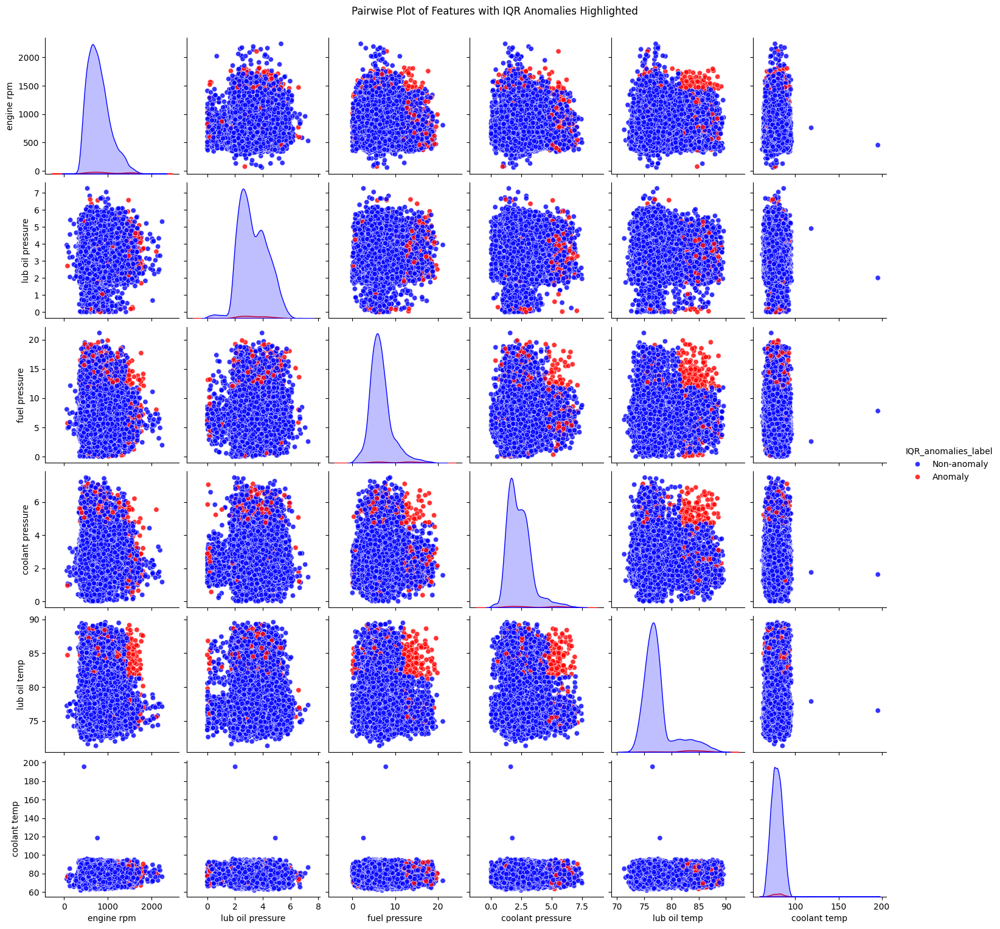

In [34]:
# Select the relevant columns for plotting
plot_columns = ['engine rpm', 'lub oil pressure', 'fuel pressure',
                'coolant pressure', 'lub oil temp', 'coolant temp']

# Create a temporary DataFrame for pairplot
plot_data = ship_data[plot_columns].copy()

# Use the 'IQR_anomalies' column for the hue with a mapping for better labels
sns.pairplot(
    plot_data.assign(IQR_anomalies_label=ship_data['IQR_anomalies'].map({True: 'Anomaly', False: 'Non-anomaly'})),
    hue='IQR_anomalies_label',
    palette={'Anomaly': 'red', 'Non-anomaly': 'blue'},
    diag_kind='kde',
    plot_kws={'alpha': 0.8}
)

# Show the plot with an updated title
plt.suptitle('Pairwise Plot of Features with IQR Anomalies Highlighted', y=1.02)
plt.show()

## 6.3 Anomaly detection using O_C_SVM

Identifying possible anomalies

Visualise the output in 2D after performing PCA

Apply different combinations of parameter settings to improve the model's performance

summary at the end of its performance

I expect better results with one class SVM as it excels in detecting anomalies within unlabelled data, it just needs careful tuning of its hyperparameters. It is also effective for imbalanced data which seems to be the case here with an abnormal number of outliers


### i. Train initial O_C_SVM model and examine anomalies detected

In [35]:
# Fit one-class SVM model on full 6 feature scaled dataset
# Model_1: gamma (0.5), nu (0.05)
model_one = OneClassSVM(kernel='rbf', gamma=0.5, nu=0.05) # - complex boundary, 5% data considered outliers
model_one.fit(df_ship_data_scaled)

OneClassSVM(gamma=0.5, nu=0.05)

In [36]:
# Predict the class (normal or anomaly) -1 = outliers, 1 = in normal range
y_pred = model_one.predict(df_ship_data_scaled)

y_pred_df = pd.DataFrame(y_pred, columns=['SVM_anomalies']) #df to store anomaly predictions, not actually used anywhere though

# Add anomaly column to a new scaled dataframe and fill with predicted anomaly values from model
df_svm = df_ship_data_scaled.copy()
df_svm['SVM_anomalies'] = y_pred

# View data
df_svm.head()

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp,SVM_anomalies
0,-0.408212,-0.892819,-0.738304,0.495596,-0.440709,-1.376412,1
1,-0.695950,2.117332,-0.083759,3.273154,-1.421047,-0.567158,-1
2,-0.497896,0.127697,-1.077426,-0.633625,3.358026,0.044690,1
3,-0.157842,-1.183534,0.168533,-0.671293,0.005852,0.637913,1
4,-0.430633,0.229492,-0.253226,0.858747,-0.776966,-1.816491,1


In [37]:
# Get number of anomalies identified
svm_anomalies_df = df_svm[df_svm.SVM_anomalies == -1]
num_anom = svm_anomalies_df.shape[0]
obs = len(df_ship_data_scaled)

# Calculate anomalies as % of total data
percent_svm_1 = (num_anom/obs)*100

# View output
print(f'Anomalous samples identified with an SVM model with params gamma=0.5, nu=0.05: SVM anomalies={num_anom}, {round(percent_svm_1, 2)}%')
svm_anomalies_df

Anomalous samples identified with an SVM model with params gamma=0.5, nu=0.05: SVM anomalies=1043, 5.34%


,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp,SVM_anomalies
1,-0.695950,2.117332,-0.083759,3.273154,-1.421047,-0.567158,-1
9,0.055159,0.629502,5.245553,-0.736041,-0.874377,-1.017425,-1
17,1.946010,2.603387,0.328859,3.470415,0.030684,1.648979,-1
25,0.619425,-0.373530,-0.860027,-1.999461,-1.064363,-0.071863,-1
35,2.177695,-0.744115,0.719102,-0.766376,1.486756,-1.871741,-1
...,...,...,...,...,...,...,...
19418,2.783067,1.440891,1.288045,-0.209072,1.207864,0.841445,-1
19433,0.727794,-0.366638,2.816375,2.556936,-0.696229,-1.388626,-1
19467,1.975905,-1.012180,2.861838,-0.856781,-0.650319,-0.691550,-1
19501,-1.275163,-2.548791,-0.921300,-1.336777,-0.891821,-0.892217,-1


###  ii. Visualisation with PCA for the initial O_C_SVM model

In [38]:
# Transform the data with PCA for visualisation
pca = PCA(n_components=2)
pca.fit(df_ship_data_scaled)
PCA_transformed_data = pca.transform(df_ship_data_scaled)

pca.explained_variance_ratio_, sum(pca.explained_variance_ratio_)

(array([0.1899485 , 0.17692968]), np.float64(0.36687817845906473))

In [40]:
# Create a DataFrame for PCA-transformed data
pca_df = pd.DataFrame(PCA_transformed_data, columns=['PC1', 'PC2'])

# Add an "anomaly" column based on the SVM predictions
pca_df['Anomaly'] = df_svm['SVM_anomalies'].map({-1: 'Anomaly', 1: 'Non-anomaly'})

# Create the scatter plot with Plotly
fig = px.scatter(
    pca_df,
    x='PC1',
    y='PC2',
    color='Anomaly',  # Color by the 'Anomaly' column
    title='Anomalies identified via O_C_SVM<br>Model_1: gamma (0.5), nu (0.05)',
    width=600,
    height=600,
    opacity=0.8,
    color_discrete_map={'Anomaly': 'red', 'Non-anomaly': 'blue'}  # Use specific colors for each label
)

# Show the plot
fig.show()

The plot does not show clear separation between anomalies and non anomalies  with lots of overlap, indicating these parameters has not worked well and is not useful

### iii. Test O_C_SVM model with varying parameters

In [41]:
# Initialize a dictionary to hold results
results_varying_params = {
    'o_c_SVM': {},  # Add a key for One-Class SVM
    'iso_forest': {}  # Add a key for Isolation Forest
}
gamma_val = [0.01, 0.05, 0.3, 0.5, 1]
nu_val = [0.01, 0.03, 0.05, 0.1]

# Total observations for percentage calculation
obs = df_ship_data_scaled.shape[0]

# Define a function to calculate proportions
def proportion(x):
    return (x / obs) * 100

# Run SVM analysis using a range of gamma and nu values
for g in gamma_val:
    results_varying_params['o_c_SVM'][g] = {}  # Create a new dictionary for each gamma value

    # Iterate over each value of nu
    for n in nu_val:
        # Initialize and fit OCSVM using scaled data
        model_svm = OneClassSVM(kernel='rbf', gamma=g, nu=n)
        model_svm.fit(df_ship_data_scaled)

        # Predict the anomalies (1 for not anomaly, -1 for anomaly)
        svm_y_pred = model_svm.predict(df_ship_data_scaled)

        # Count anomalies
        num_anomalies = sum(svm_y_pred == -1)

        # Calculate percentage of anomalies
        percentage = proportion(num_anomalies)

        # Store both counts and percentages in the same dictionary
        results_varying_params['o_c_SVM'][g][n] = {
            'num_anomalies': num_anomalies,      # Count of anomalies
            'percentage': percentage,             # Percentage of anomalies
            'predictions': svm_y_pred             # Store the predictions
        }

# Print the results with counts and percentages on one line
print("Anomaly Counts and Percentages by Gamma and Nu:")
for g, nu_results in results_varying_params['o_c_SVM'].items():
    for n, result_dict in nu_results.items():
        count = result_dict['num_anomalies']  # Extract number of anomalies
        percentage = result_dict['percentage']  # Extract percentage
        print(f"Gamma: {g}, Nu: {n}, Anomalies: {count}, Percentage: {percentage:.2f}%")

Anomaly Counts and Percentages by Gamma and Nu:
Gamma: 0.01, Nu: 0.01, Anomalies: 197, Percentage: 1.01%
Gamma: 0.01, Nu: 0.03, Anomalies: 586, Percentage: 3.00%
Gamma: 0.01, Nu: 0.05, Anomalies: 977, Percentage: 5.00%
Gamma: 0.01, Nu: 0.1, Anomalies: 1953, Percentage: 10.00%
Gamma: 0.05, Nu: 0.01, Anomalies: 199, Percentage: 1.02%
Gamma: 0.05, Nu: 0.03, Anomalies: 583, Percentage: 2.98%
Gamma: 0.05, Nu: 0.05, Anomalies: 978, Percentage: 5.01%
Gamma: 0.05, Nu: 0.1, Anomalies: 1952, Percentage: 9.99%
Gamma: 0.3, Nu: 0.01, Anomalies: 275, Percentage: 1.41%
Gamma: 0.3, Nu: 0.03, Anomalies: 589, Percentage: 3.02%
Gamma: 0.3, Nu: 0.05, Anomalies: 980, Percentage: 5.02%
Gamma: 0.3, Nu: 0.1, Anomalies: 1952, Percentage: 9.99%
Gamma: 0.5, Nu: 0.01, Anomalies: 611, Percentage: 3.13%
Gamma: 0.5, Nu: 0.03, Anomalies: 737, Percentage: 3.77%
Gamma: 0.5, Nu: 0.05, Anomalies: 1043, Percentage: 5.34%
Gamma: 0.5, Nu: 0.1, Anomalies: 1984, Percentage: 10.16%
Gamma: 1, Nu: 0.01, Anomalies: 1932, Percenta

In [43]:
# Create a DataFrame from the results_varying_params dictionary for easier visualization
svm_percentages_df = pd.DataFrame()

# Populate the DataFrame with the percentages from results_varying_params
# Access the 'o_c_SVM' key first
for g, nu_results in results_varying_params['o_c_SVM'].items():
    for n, result_dict in nu_results.items():
        percentage = result_dict['percentage']  # Extract percentage
        # Add the percentage to the DataFrame
        svm_percentages_df.at[g, n] = percentage

# Transpose for better readability
svm_percentages_df = svm_percentages_df.T  # Transpose the DataFrame
svm_percentages_df.index.name = 'Nu'
svm_percentages_df.columns.name = 'Gamma'
svm_percentages_df = svm_percentages_df.round(2)  # Round the values for better readability

# Print the DataFrame
print("\nAnomaly Percentages by Gamma and Nu:")
display(svm_percentages_df)


Anomaly Percentages by Gamma and Nu:


Gamma,0.01,0.05,0.30,0.50,1.00
Nu,,,,,
0.01,1.01,1.02,1.41,3.13,9.89
0.03,3.00,2.98,3.02,3.77,9.52
0.05,5.00,5.01,5.02,5.34,9.53
0.10,10.00,9.99,9.99,10.16,12.01


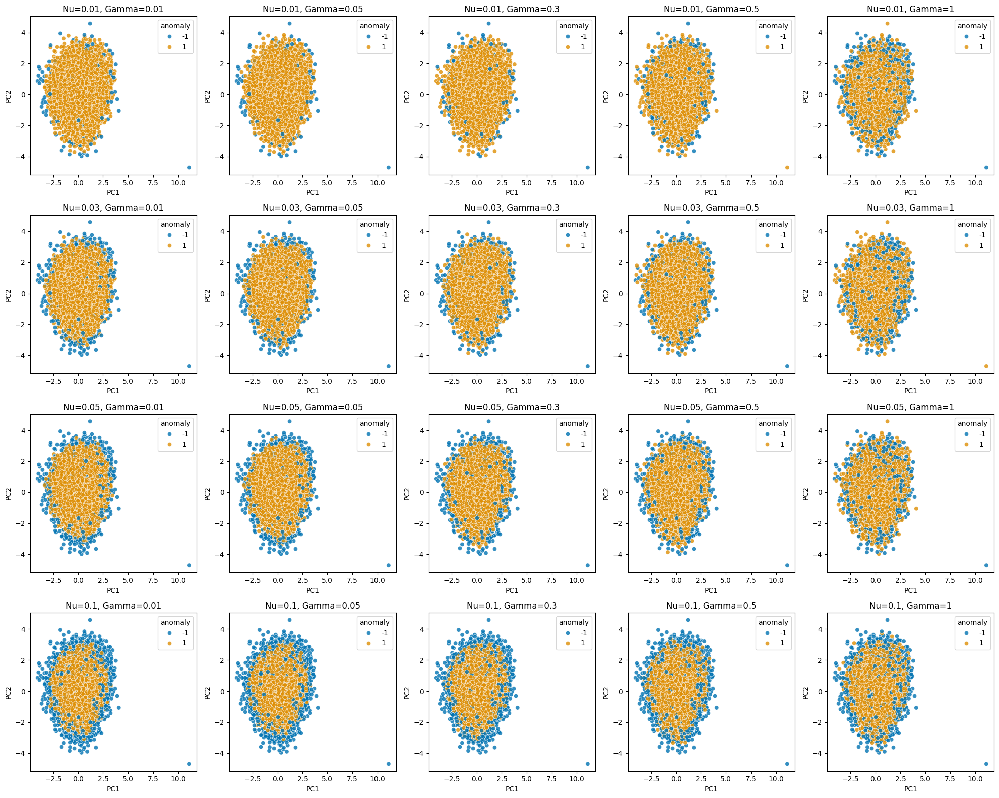

In [52]:
# Define the grid dimensions (4 rows and 5 columns)
rows = 4
cols = 5

# Create the figure with subplots arranged in 4x5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20, 16))
axes = axes.flatten()  # Flatten the axes to make it easier to index

plot_idx = 0  # Keep track of which subplot we're on

for j, n in enumerate(nu_val):  # Iterate over nu for columns
    for i, g in enumerate(gamma_val):  # Iterate over gamma for rows
        # Initialize and fit the model for the current gamma and nu values
        model_svm = OneClassSVM(kernel='rbf', gamma=g, nu=n)
        model_svm.fit(df_ship_data_scaled)

        # Predict anomalies for the scaled data
        svm_y_pred = model_svm.predict(df_ship_data_scaled)

        # Apply PCA to the data for visualization
        pca = PCA(n_components=2)
        pca_result = pca.fit_transform(df_ship_data_scaled)

        # Create a DataFrame for better plotting
        svm_results_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
        svm_results_df['anomaly'] = svm_y_pred

        # Create a scatterplot (remove KDE and use scatter)
        ax = axes[plot_idx]  # Get the current axis
        sns.scatterplot(data=svm_results_df, x='PC1', y='PC2', hue='anomaly', palette="colorblind", alpha=0.8, ax=ax)

        # Title of the plot
        ax.set_title(f"Nu={n}, Gamma={g}")

        plot_idx += 1
        if plot_idx >= len(axes):  # Stop if all subplots are used
            break

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

After testing varying hyperparameters, the model performs best with `nu=0.05`.

Key findings:
- The proportion of anomalies identified remains consistent across gamma values except for gamma values = 0.50 & 1 where the proportion spikes, visually we can see the the clustering is not performing well for these values.

- A low gamma value (`gamma=0.01`) seems to produce the best results. This configuration results in 977 anomalies (5%).

Notably:
- At `nu=0.05`, the increase in anomalies identified between `gamma=0.3` and `gamma=0.5` is smaller compared to `nu=0.03`. This suggests that higher values of `nu` may capture clustered anomalies more effectively.

Future Work:
Further analysis is needed to evaluate the performance of these hyperparameter settings on unseen data to ensure robustness.

Next Steps:
The optimal model (`nu=0.05`, `gamma=0.01`) can now be visualized in 2D using PCA to better understand the anomaly clusters and their distribution in the feature space.

Visually via the plot I can confirm the optimal model is (`nu=0.05`, `gamma=0.01`), having said that, there is no clear separation as there is still some overlap between points, indicating that this approach has not worked as well as I would have hoped.

In [45]:
# Extract the number of anomalies for gamma=0.01, nu=0.05 - optimum model
optimal_model = results_varying_params['o_c_SVM'][0.01][0.05]
optimal_model_anomalies = optimal_model['num_anomalies']

print(f"Optimal Model: gamma=0.01 and nu=0.05: {optimal_model_anomalies}")

Optimal Model: gamma=0.01 and nu=0.05: 977


In [46]:
predictions_for_optimal_params = results_varying_params['o_c_SVM'][0.01][0.05]['predictions']
predictions_for_optimal_params

array([ 1, -1,  1, ..., -1,  1,  1])

In [85]:
# Create a copy of the standardized data
df_svm = df_ship_data_scaled.copy()

# Add the predictions as a new column in the DataFrame
df_svm['SVM_anomalies'] = predictions_for_optimal_params

# View the first few rows of the DataFrame
display(df_svm.head())

# Get anomaly index values from SVM anomalies
anomaly_indices = df_svm[df_svm.SVM_anomalies == -1].index.tolist()

# Update the anomaly_comparison dictionary with the optimum SVM model details
anomaly_comparison['SVM_optimum'] = {
    'anomaly_list': anomaly_indices,  # Get the anomaly indices from the dataframe
    'predictions': df_svm['SVM_anomalies'].tolist(),  # Store the predictions (-1 or 1)
    'count': len(anomaly_indices),  # Count of anomalies
    'percent': (len(anomaly_indices) / obs) * 100,  # Calculate percentage of anomalies
    'model_config': {
        'kernel': 'rbf',
        'gamma': 0.01,
        'nu': 0.05
    }
}

# Identify common samples and differences between optimum SVM and IQR anomaly lists
matches_optimum = set(anomaly_comparison['SVM_optimum']['anomaly_list']) & set(anomaly_comparison['IQR_optimum']['anomaly_list'])

# View output for optimum SVM and IQR
print(f"Anomalies from Optimum SVM: {anomaly_comparison['SVM_optimum']['count']} - {anomaly_comparison['SVM_optimum']['percent']:.2f}%")
print(f"Anomalies from IQR: {anomaly_comparison['IQR_optimum']['count']} - {anomaly_comparison['IQR_optimum']['percent']:.2f}%")
print(f"Number of matches between SVM Optimum and IQR: {len(matches_optimum)}")
print()

# Print the optimum SVM model configuration
print("Optimum SVM Model Configuration:")
for key, value in anomaly_comparison['SVM_optimum']['model_config'].items():
    print(f"{key}: {value}")

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp,SVM_anomalies
0,-0.408212,-0.892819,-0.738304,0.495596,-0.440709,-1.376412,1
1,-0.695950,2.117332,-0.083759,3.273154,-1.421047,-0.567158,-1
2,-0.497896,0.127697,-1.077426,-0.633625,3.358026,0.044690,1
3,-0.157842,-1.183534,0.168533,-0.671293,0.005852,0.637913,1
4,-0.430633,0.229492,-0.253226,0.858747,-0.776966,-1.816491,1


Anomalies from Optimum SVM: 977 - 5.00%
Anomalies from IQR: 422 - 2.16%
Number of matches between SVM Optimum and IQR: 208

Optimum SVM Model Configuration:
kernel: rbf
gamma: 0.01
nu: 0.05


### vi. Visualising anomalies identified by optimal SVM model

In [86]:
# Convert PCA_transformed_data to a DataFrame for Seaborn compatibility
pca_df = pd.DataFrame(PCA_transformed_data, columns=['PC1', 'PC2'])

# Create a Series to represent anomaly labels
anomaly_labels = pd.Series(df_svm.index.isin(anomaly_comparison['SVM_optimum']['anomaly_list'])).map({True: 'Anomaly', False: 'Non-anomaly'})

# Add the anomaly labels to the PCA DataFrame
pca_df['Anomaly'] = anomaly_labels

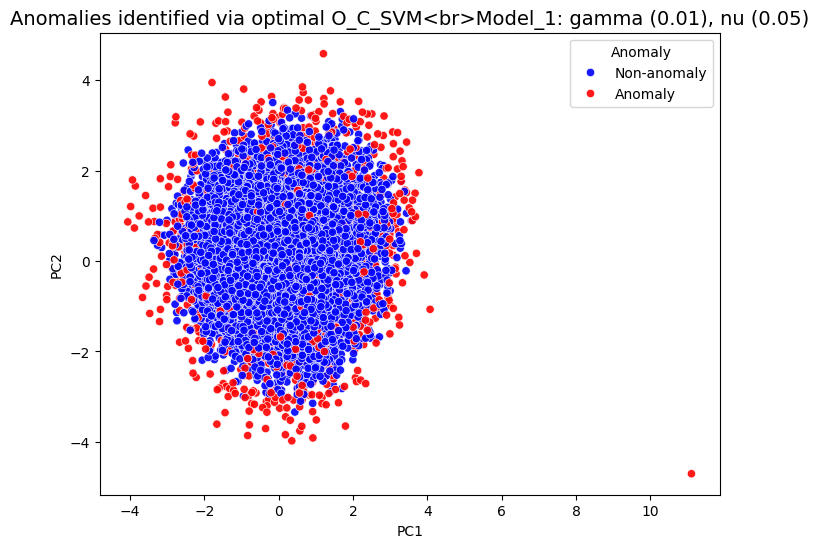

In [87]:
# Set up the plot
plt.figure(figsize=(8, 6))

# Create the scatter plot
sns.scatterplot(
    x='PC1',
    y='PC2',
    hue='Anomaly',
    data=pca_df,
    palette={'Anomaly': 'red', 'Non-anomaly': 'blue'},
    alpha=0.9
)

# Set plot title and labels
plt.title('Anomalies identified via optimal O_C_SVM<br>Model_1: gamma (0.01), nu (0.05)', fontsize=14)
plt.xlabel('PC1')
plt.ylabel('PC2')

# Show the plot
plt.show()

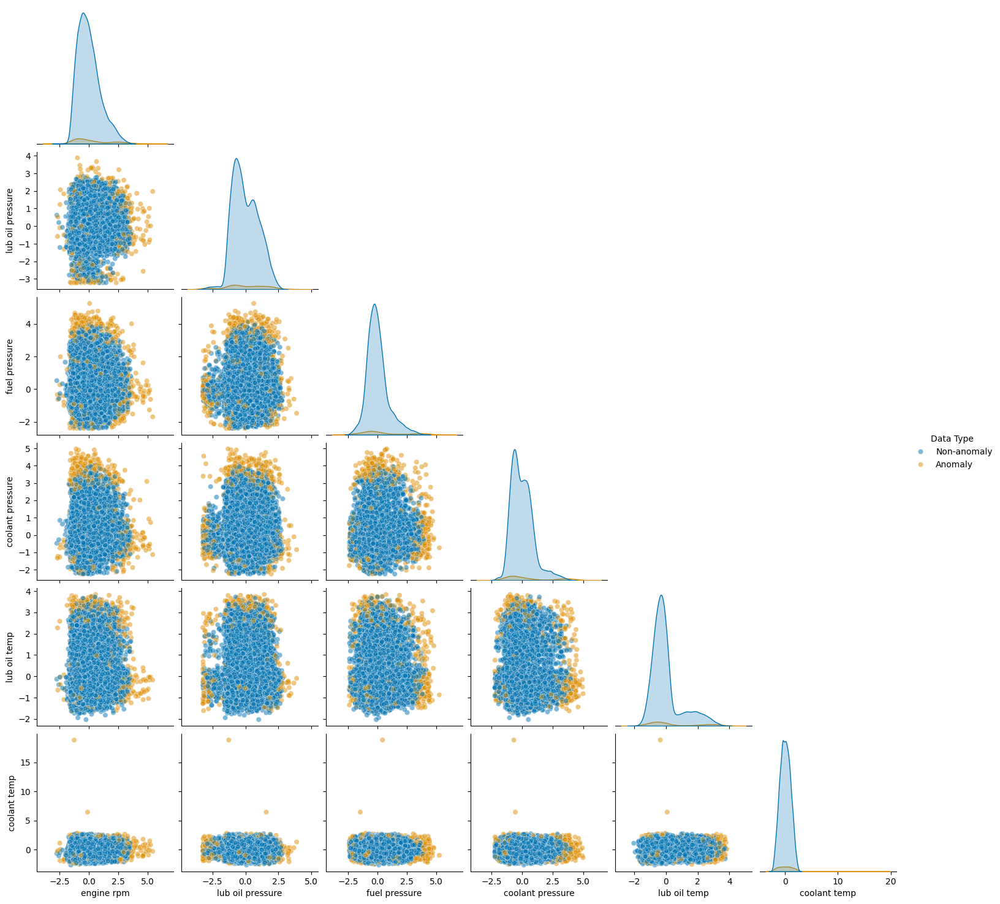

In [51]:
# Create a new column for the anomaly labels
df_svm['SVM_anomalies'] = pd.Series(df_svm.index.isin(anomaly_comparison['SVM_optimum']['anomaly_list'])).map({True: 'Anomaly', False: 'Non-anomaly'})

# Plot pairplot with anomaly data points colored and transparency adjusted
g = sns.pairplot(
    df_svm,
    hue='SVM_anomalies',
    palette="colorblind",  # Using seaborn's colorblind palette
    corner=True,
    plot_kws={'alpha': 0.5}  # Adjust transparency
)

# Customize the legend
g._legend.set_title('Data Type')  # Set the title of the legend

# Display the plot
plt.show()

## 6.3 SVM Summary

Anomalies were identified using one-class SVM, with 977 anomalies detected using the optimised parameter settings.

This corresponded to a 5% anomaly proportion, which is within the expected range of 1-5%.

However, the number identified is heavily influenced by the parameters chosen, and without further knowledge of which records led to ship performance issues it is difficult to fine-tune the anomaly detection further. As we can see from the pairplots and PCA plots there is still overlap between anomalies and regular data points

## 6.4 Using Isolation Forest

Identifying possible anomalies

Visualise the output in 2D after performing PCA

Applying different combinations of parameter settings to improve the model's performance

### i. Train initial isolation forest model

In [59]:
df_ship_data_scaled

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp
0,-0.408212,-0.892819,-0.738304,0.495596,-0.440709,-1.376412
1,-0.695950,2.117332,-0.083759,3.273154,-1.421047,-0.567158
2,-0.497896,0.127697,-1.077426,-0.633625,3.358026,0.044690
3,-0.157842,-1.183534,0.168533,-0.671293,0.005852,0.637913
4,-0.430633,0.229492,-0.253226,0.858747,-0.776966,-1.816491
...,...,...,...,...,...,...
19530,-0.411949,0.288774,0.233701,-1.208058,-0.461752,-1.382184
19531,-0.789372,-1.038290,-0.511826,-0.833709,-0.243824,1.397013
19532,-0.654845,0.006141,-1.038745,3.537070,-0.563698,-1.000134
19533,1.389218,-0.559945,-1.069205,0.594695,-0.276059,0.478951


In [60]:
# Initialize and fit Isolation Forest using scaled data
iso_forest_model_1 = IsolationForest(n_estimators=100, contamination=0.05, random_state=42)
iso_forest_model_1.fit(df_ship_data_scaled)

IsolationForest(contamination=0.05, random_state=42)

In [61]:
# Predict the anomalies, 1 for not an anomaly
iso_y_pred = iso_forest_model_1.predict(df_ship_data_scaled)

# Create new dataframe for isolation forest anomaly analysis
df_iso = df_ship_data_scaled.copy()

# Add anomaly column to DataFrame.
df_iso['iso_anomaly'] = iso_y_pred

df_iso.head()

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp,iso_anomaly
0,-0.408212,-0.892819,-0.738304,0.495596,-0.440709,-1.376412,1
1,-0.695950,2.117332,-0.083759,3.273154,-1.421047,-0.567158,-1
2,-0.497896,0.127697,-1.077426,-0.633625,3.358026,0.044690,1
3,-0.157842,-1.183534,0.168533,-0.671293,0.005852,0.637913,1
4,-0.430633,0.229492,-0.253226,0.858747,-0.776966,-1.816491,1


In [62]:
# Create anomaly-only df
iso_anomalies = df_iso[df_iso['iso_anomaly'] == -1]

# Get number of anomalies identified
num_anom_iso = iso_anomalies.shape[0]

# Calculate anomalies as % of total data
percent_iso_1 = (num_anom_iso/obs)*100

# View output
print(f'Anomalous samples (n_estimators=100, contamination=0.05):", ISO anomalies={num_anom_iso}, {round(percent_iso_1,2)}%')
iso_anomalies

Anomalous samples (n_estimators=100, contamination=0.05):", ISO anomalies=977, 5.0%


,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp,iso_anomaly
1,-0.695950,2.117332,-0.083759,3.273154,-1.421047,-0.567158,-1
17,1.946010,2.603387,0.328859,3.470415,0.030684,1.648979,-1
35,2.177695,-0.744115,0.719102,-0.766376,1.486756,-1.871741,-1
113,2.629855,-0.026963,-1.065293,0.154286,2.381887,-0.432513,-1
131,0.144843,-0.070347,2.471453,0.224563,3.162084,-0.805470,-1
...,...,...,...,...,...,...,...
19343,2.555118,-1.096079,-0.035157,-1.032393,2.343389,1.556600,-1
19370,-0.191474,-0.500402,1.703548,-0.728687,3.583673,-1.350141,-1
19375,0.776373,-3.109890,-0.561144,1.546654,-0.963731,2.243787,-1
19433,0.727794,-0.366638,2.816375,2.556936,-0.696229,-1.388626,-1


### ii Visualise with PCA for initial Iso forest model

In [63]:
# Add an "anomaly" column based on the IsoForest predictions
pca_df = pd.DataFrame(PCA_transformed_data, columns=['PC1', 'PC2'])

# Map IsoForest predictions (-1 = Anomaly, 1 = Non-anomaly)
pca_df['Anomaly'] = df_iso['iso_anomaly'].map({-1: 'Anomaly', 1: 'Non-anomaly'})

# Create the scatter plot with Plotly
fig = px.scatter(
    pca_df,
    x='PC1',
    y='PC2',
    width=600,
    height=600,
    title='Anomalies identified via Iso forest <br>Model_1: n_estimators (100), contamination (0.05)',
    color='Anomaly',  # Use the 'Anomaly' column for coloring
    color_discrete_map={'Anomaly': 'red', 'Non-anomaly': 'blue'},  # Set custom colors
    opacity=0.5
)

# Show the plot
fig.show()

The plot does not show clear separation between anomalies and non anomalies  with lots of overlap, indicating these parameters has not worked well and is not useful

### iii. hyperparameter tuning

In [64]:
n_estimators_list = [100, 300, 500]
contamination_list = [0.01, 0.03, 0.05, 0.1]

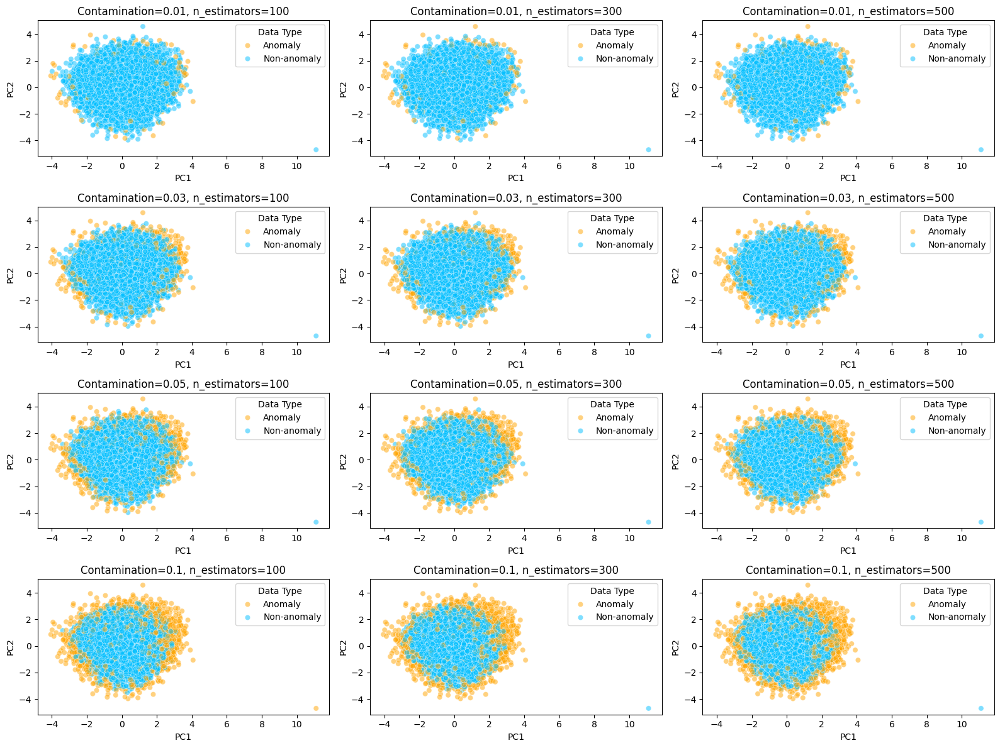

Contamination: 0.01, n_estimators: 100, Number of anomalies: 196
Contamination: 0.01, n_estimators: 300, Number of anomalies: 196
Contamination: 0.01, n_estimators: 500, Number of anomalies: 196
Contamination: 0.03, n_estimators: 100, Number of anomalies: 587
Contamination: 0.03, n_estimators: 300, Number of anomalies: 587
Contamination: 0.03, n_estimators: 500, Number of anomalies: 587
Contamination: 0.05, n_estimators: 100, Number of anomalies: 977
Contamination: 0.05, n_estimators: 300, Number of anomalies: 977
Contamination: 0.05, n_estimators: 500, Number of anomalies: 977
Contamination: 0.1, n_estimators: 100, Number of anomalies: 1954
Contamination: 0.1, n_estimators: 300, Number of anomalies: 1954
Contamination: 0.1, n_estimators: 500, Number of anomalies: 1954


In [65]:
# Set up the grid of subplots (4 rows, 3 columns)
fig, axes = plt.subplots(4, 3, figsize=(16, 12))
axes = axes.flatten()  # Flatten to easily iterate over them

# Loop over each contamination value and plot the corresponding anomalies for each n_estimators value
plot_idx = 0  # Start indexing for subplots
for contamination in contamination_list:
    results_varying_params['iso_forest'][contamination] = {}  # Initialize for each contamination level

    for n_estimators in n_estimators_list:
        # Initialize Isolation Forest model
        iso_forest = IsolationForest(n_estimators=n_estimators, contamination=contamination, random_state=42)

        # Fit the model on the scaled data
        iso_forest.fit(df_ship_data_scaled)

        # Predict anomalies (-1 for anomalies, 1 for normal points)
        anomalies = iso_forest.predict(df_ship_data_scaled)

        # Map anomalies to "Anomaly" and "Non-anomaly"
        anomaly_labels = ['Anomaly' if x == -1 else 'Non-anomaly' for x in anomalies]

        # Store the anomalies for later inspection (keep the structure of nested dictionary)
        results_varying_params['iso_forest'][contamination][n_estimators] = {
            'anomalies': anomalies,  # Store predictions
            'labels': anomaly_labels  # Store mapped labels
        }

        # Convert the labels to a categorical type to ensure proper hue handling
        anomaly_labels = pd.Categorical(anomaly_labels, categories=["Anomaly", "Non-anomaly"])

        # Plotting the results using pre-transformed PCA data
        ax = axes[plot_idx]
        sns.scatterplot(
            x=PCA_transformed_data[:, 0],
            y=PCA_transformed_data[:, 1],
            hue=anomaly_labels,  # Use mapped anomaly labels
            palette={'Anomaly': 'orange', 'Non-anomaly': 'deepskyblue'},  # Explicitly define colors for each category
            alpha=0.5,
            ax=ax
        )

        # Get the handles and labels from the legend to manually adjust them
        handles, labels = ax.get_legend_handles_labels()

        # Adjust the legend manually to ensure correct labels are associated with the colors
        ax.legend(handles=handles, labels=["Anomaly", "Non-anomaly"], title='Data Type')

        # Add title and labels to each plot
        ax.set_title(f'Contamination={contamination}, n_estimators={n_estimators}')
        ax.set_xlabel('PC1')
        ax.set_ylabel('PC2')

        plot_idx += 1  # Move to the next subplot

# Adjust layout to make sure plots don't overlap
plt.tight_layout()
plt.show()

# Optionally, print the anomaly counts for each configuration
for contamination, n_results in results_varying_params['iso_forest'].items():
    for n_estimators, result in n_results.items():
        anomalies = result['anomalies']
        num_anomalies = sum(anomalies == -1)  # Count anomalies
        print(f"Contamination: {contamination}, n_estimators: {n_estimators}, Number of anomalies: {num_anomalies}")

After using Isolation forest for anomaly detection we can see here also that there is no real separation and that it has not performed well on this data set, if I had to choose an "optimal model" it would be contamination = 0.03 and n_estimators = 100

### iii Visualising anomalies identified by optimal isolation forest model

In [66]:
# Extract the number of anomalies for contamination=0.03, n_estimators=100 - optimal model
optimal_model_iso = results_varying_params['iso_forest'][0.03][100]
anomalies = optimal_model_iso['anomalies']

# Count the number of anomalies (those with value -1)
optimal_model_anomalies_iso = sum(anomalies == -1)

print(f"Optimal Model: contamination=0.03 and n_estimators=100, Number of anomalies: {optimal_model_anomalies_iso}")

# Create labels for anomalies based on predictions
anomaly_labels = ['Anomaly' if x == -1 else 'Non-anomaly' for x in anomalies]

# Create a DataFrame for PCA-transformed data
pca_df = pd.DataFrame(PCA_transformed_data, columns=['PC1', 'PC2'])
pca_df['Anomaly'] = pd.Categorical(anomaly_labels, categories=["Anomaly", "Non-anomaly"])

Optimal Model: contamination=0.03 and n_estimators=100, Number of anomalies: 587


Note next time have separate coloumns for iso forest and svm anomalies in the df

In [67]:
# Extract the number of anomalies for contamination=0.03, n_estimators=100 - optimum model
optimal_model_iso = results_varying_params['iso_forest'][0.03][100]
anomalies = optimal_model_iso['anomalies']

# Count the number of anomalies (those with value -1)
optimal_model_anomalies_iso = sum(anomalies == -1)

print(f"Optimal Model: contamination=0.03 and n_estimators=100, Number of anomalies: {optimal_model_anomalies_iso}")

Optimal Model: contamination=0.03 and n_estimators=100, Number of anomalies: 587


In [68]:
predictions_for_optimal_params_iso = results_varying_params['iso_forest'][0.03][100]['anomalies']
print(predictions_for_optimal_params_iso)

[ 1 -1  1 ...  1  1  1]


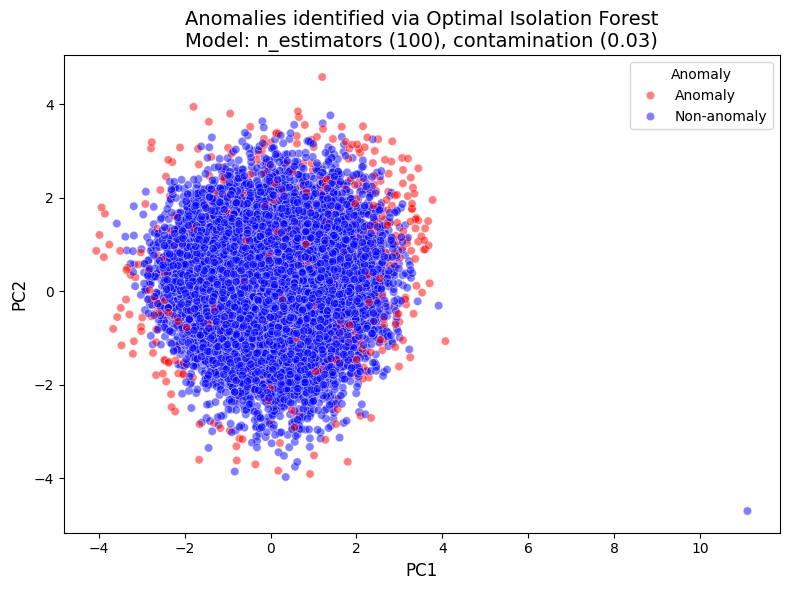

In [69]:
# Create the scatter plot using Seaborn
plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=pca_df,
    x='PC1',
    y='PC2',
    hue='Anomaly',  # Use the 'Anomaly' column for coloring
    palette={'Anomaly': 'red', 'Non-anomaly': 'blue'},  # Custom colors for the legend
    alpha=0.5
)

# Add title and labels
plt.title('Anomalies identified via Optimal Isolation Forest\nModel: n_estimators (100), contamination (0.03)', fontsize=14)
plt.xlabel('PC1', fontsize=12)
plt.ylabel('PC2', fontsize=12)

# Show the plot
plt.legend(title='Anomaly', loc='upper right')
plt.tight_layout()
plt.show()

The most interesting observation is that in the bottom right hand corner we can see that a data point that is clearly an anomaly is categorised as non-anomalous. This indicates that this model is not useful.

We can see here that serparation between clusters is not clear with plenty of overlap using isoforest, identifying clusters for unstructured data without true labels is challenging for this data set

In [70]:
# Create the scatter plot with Plotly using Isolation Forest anomaly results
fig = px.scatter(
    pca_df,
    x='PC1',
    y='PC2',
    color='Anomaly',  # Use the 'Anomaly' column for coloring
    width=600,
    height=600,
    title='Anomalies identified via Optimal Isolation Forest<br>Model: n_estimators (100), contamination (0.03)',
    opacity=0.5,
    color_discrete_map={'Anomaly': 'red', 'Non-anomaly': 'blue'}  # Custom colors for the legend
)

# Show the plot
fig.show()

## 6.4 Iso_forest Summary

Anomalies were identified using Iso forest, with 587 anomalies detected using the optimised parameter settings.

This corresponded to a 3% anomaly proportion, which is within the expected range of 1-5%.

However, the number identified is heavily influenced by the parameters chosen, and without further knowledge of which records led to ship performance issues it is difficult to fine-tune the anomaly detection further. As we can see from the pairplots and PCA plots there is still some overlap between anomalies and data points.

Most importantly the model failed to capture a data point that is clearly anomalous in nature, indicating this model has performed worse compared to the other approaches.

# 7. Summary of the projects analysis, approach and major inferences

In [71]:
# Add the optimal Isolation Forest anomalies to anomaly_comparison first
iso_anomalies = results_varying_params['iso_forest'][0.03][100]['anomalies']  # Optimal model 0.05 contamination and 100 n_estimators
iso_anomaly_indices = ship_data.index[iso_anomalies == -1].tolist()  # Get indices where anomalies are detected

# Update the anomaly_comparison dictionary with the ISO anomalies
anomaly_comparison['ISO_optimum'] = {
    'anomaly_list': iso_anomaly_indices,
    'predictions': iso_anomalies.tolist(),  # Store predictions in anomaly_comparison
    'count': len(iso_anomaly_indices),
    'percent': (len(iso_anomaly_indices) / obs) * 100,
    'model_config': {
        'n_estimators': 100,
        'contamination': 0.03
    }
}

# Now, update the ship_data with ISO anomalies
ship_data['ISO_anomalies'] = pd.Series(iso_anomalies).map({-1: -1, 1: 1})  # Mark anomalies as -1 where detected

# Add the optimal SVM anomalies to anomaly_comparison next
svm_anomaly_indices = anomaly_comparison['SVM_optimum']['anomaly_list']
svm_anomalies = pd.Series(ship_data.index.isin(svm_anomaly_indices)).map({True: -1, False: 1}).tolist()

# Update the anomaly_comparison dictionary with the SVM anomalies
anomaly_comparison['SVM_optimum'] = {
    'anomaly_list': svm_anomaly_indices,
    'predictions': svm_anomalies,
    'count': len(svm_anomaly_indices),
    'percent': (len(svm_anomaly_indices) / obs) * 100,
    'model_config': {
        'gamma': 0.01,
        'nu': 0.05
    }
}

# Now, update the ship_data with SVM anomalies
ship_data['SVM_anomalies'] = pd.Series(svm_anomalies).map({-1: -1, 1: 1})  # Mark anomalies as -1 where detected

# Add the IQR anomalies to ship_data (assuming IQR anomalies have already been detected and added to anomaly_comparison)
# For example, if we have 'IQR_optimum' in anomaly_comparison, then we can extract the anomaly indices like so:
iqr_anomaly_indices = anomaly_comparison['IQR_optimum']['anomaly_list']
iqr_anomalies = pd.Series(ship_data.index.isin(iqr_anomaly_indices)).map({True: -1, False: 1}).tolist()

# Update the anomaly_comparison dictionary with the IQR anomalies
anomaly_comparison['IQR_optimum'] = {
    'anomaly_list': iqr_anomaly_indices,
    'predictions': iqr_anomalies,
    'count': len(iqr_anomaly_indices),
    'percent': (len(iqr_anomaly_indices) / obs) * 100,
    'model_config': {}
}

# Now, update the ship_data with IQR anomalies
ship_data['IQR_anomalies'] = pd.Series(iqr_anomalies).map({-1: -1, 1: 1})  # Mark anomalies as -1 where detected

# View the first few rows of the DataFrame with the added anomaly columns
display(ship_data.head())

# Identify common samples and differences
matches_svm_iso = set(anomaly_comparison['SVM_optimum']['anomaly_list']) & set(anomaly_comparison['ISO_optimum']['anomaly_list'])
matches_svm_iqr = set(anomaly_comparison['SVM_optimum']['anomaly_list']) & set(anomaly_comparison['IQR_optimum']['anomaly_list'])
matches_iso_iqr = set(anomaly_comparison['ISO_optimum']['anomaly_list']) & set(anomaly_comparison['IQR_optimum']['anomaly_list'])

# Calculate percentages of matches
total_svm = len(anomaly_comparison['SVM_optimum']['anomaly_list'])
total_iso = len(anomaly_comparison['ISO_optimum']['anomaly_list'])
total_iqr = len(anomaly_comparison['IQR_optimum']['anomaly_list'])

percent_matches_svm_iso = (len(matches_svm_iso) / total_svm) * 100
percent_matches_svm_iqr = (len(matches_svm_iqr) / total_svm) * 100
percent_matches_iso_iqr = (len(matches_iso_iqr) / total_iso) * 100

# Output results
print(f"Anomalies from Optimum SVM: {anomaly_comparison['SVM_optimum']['count']} - {anomaly_comparison['SVM_optimum']['percent']:.2f}%")
print(f"Anomalies from Optimum Isolation Forest: {anomaly_comparison['ISO_optimum']['count']} - {anomaly_comparison['ISO_optimum']['percent']:.2f}%")
print(f"Anomalies from IQR: {anomaly_comparison['IQR_optimum']['count']} - {anomaly_comparison['IQR_optimum']['percent']:.2f}%")
print(f"Number of matches between SVM Optimum and Optimum Isolation Forest: {len(matches_svm_iso)} ({percent_matches_svm_iso:.2f}%)")
print(f"Number of matches between SVM Optimum and IQR: {len(matches_svm_iqr)} ({percent_matches_svm_iqr:.2f}%)")
print(f"Number of matches between Isolation Forest and IQR: {len(matches_iso_iqr)} ({percent_matches_iso_iqr:.2f}%)")

# Identify where all three models agree as anomalies
ship_data['All_agree_anomalies'] = (ship_data['SVM_anomalies'] == -1) & (ship_data['ISO_anomalies'] == -1) & (ship_data['IQR_anomalies'] == -1)

# Extract rows where all three models agree
all_agree_rows = ship_data[ship_data['All_agree_anomalies'] == True]

# Count and percentage of rows where all three models agree
all_agree_count = len(all_agree_rows)
all_agree_percent = (all_agree_count / len(ship_data)) * 100

# Output the results of where all three models agree
print(f"Number of matches where all three models (SVM, ISO, IQR) agree are anomalies: {all_agree_count} ({all_agree_percent:.2f}%)")
print()

# Additional line for IQR explanation
print("For IQR, an anomaly was identified if 2 or more features were outliers.\n")

# Print the optimum SVM model configuration
print("Optimum SVM Model Configuration:")
for key, value in anomaly_comparison['SVM_optimum']['model_config'].items():
    print(f"{key}: {value}")

# Print the optimum Isolation Forest model configuration
print("\nOptimum Isolation Forest Model Configuration:")
for key, value in anomaly_comparison['ISO_optimum']['model_config'].items():
    print(f"{key}: {value}")

,engine rpm,lub oil pressure,fuel pressure,coolant pressure,lub oil temp,coolant temp,engine rpm_iqr_anomaly,lub oil pressure_iqr_anomaly,fuel pressure_iqr_anomaly,coolant pressure_iqr_anomaly,lub oil temp_iqr_anomaly,coolant temp_iqr_anomaly,IQR_anomalies,ISO_anomalies,SVM_anomalies
0,682,2.391656,4.617196,2.848982,76.272417,69.884609,False,False,False,False,False,False,1,1,1
1,605,5.466877,6.424361,5.727520,73.222679,74.907314,False,False,False,True,False,False,1,-1,-1
2,658,3.434232,3.680896,1.678708,88.089916,78.704806,False,False,False,False,True,False,1,1,1
3,749,2.094656,7.120927,1.639670,77.661625,82.386700,False,False,False,False,False,False,1,1,1
4,676,3.538228,5.956472,3.225336,75.226352,67.153220,False,False,False,False,False,False,1,1,1


Anomalies from Optimum SVM: 977 - 5.00%
Anomalies from Optimum Isolation Forest: 587 - 3.00%
Anomalies from IQR: 422 - 2.16%
Number of matches between SVM Optimum and Optimum Isolation Forest: 421 (43.09%)
Number of matches between SVM Optimum and IQR: 208 (21.29%)
Number of matches between Isolation Forest and IQR: 221 (37.65%)
Number of matches where all three models (SVM, ISO, IQR) agree are anomalies: 176 (0.90%)

For IQR, an anomaly was identified if 2 or more features were outliers.

Optimum SVM Model Configuration:
gamma: 0.01
nu: 0.05

Optimum Isolation Forest Model Configuration:
n_estimators: 100
contamination: 0.03


The purpose of this project was to identify anomalous activity in a ship’s engine, this is because a poorly maintained ship engine in the supply chain industry can lead to inefficiencies, increased fuel consumption, higher risks of malfunctions, and potential safety hazards".

Any issues with engines could lead to engine malfunctions, potential safety hazards, and downtime (e.g. delayed deliveries), resulting in the breakdown of a ship / reduced performance, consequently impacting the business, such as affecting revenue via failure to deliver goods.

By identifying anomalies that could be indicators of maintenance being required, the business aims to increase profit by reducing downtime, reducing safety risks for the crew, limiting fuel consumption, and increasing customer satisfaction through timely deliveries.

This highlights the business requirements to carefully examine and detect such anomalies.

The business expects about 1% to 5% of the data provided are anomalies. This represents a range of 195-977 anomalies in total out of 19535 data points examined across 6 engines: Engine rpm (revolutions per minute), Lubrication oil pressure, Fuel pressure, Coolant pressure, Lubrication oil temperature, and Coolant temperature.

---

3 approaches were utilised for anomaly detection:

*   IQR
*   One_Class_SVM
*   Isolation_Forest

The first method is a statistical method which examines outlier values, and the last two are machine learning methods which aim to find anomalies in the data with hyperparameter tuning applied.


*   IsolationForest (optimal n_estimators: 100
contamination: 0.03) - 977 (5%) suspected issues were detected.
*   OneClassSVM (optimal gamma: 0.01
nu: 0.05) - 587 (3%) suspected issues were detected.
*   IQR anomalies (2>= features outliers) -  (2.16%) suspected issues were detected.

*   Visually looking at anomalies on the PCA plots and pair plots it could be seen for all models that there is no clear separation and clusters for all 3 approaches indicating that no approach is perfect and that identifying anomalies in unstructured data sets without true labels is challenging.

Comparing the different approaches we can see where there is overlap between the approaches:
*   Number of matches between SVM Optimum and Optimum Isolation Forest: 421 (43.09%)
*   Number of matches between SVM Optimum and IQR: 208 (21.29%)
*   Number of matches between Isolation Forest and IQR: 221 (37.65%)
*   Number of matches where all three models (SVM, ISO, IQR) agree are anomalies: 176 (0.90%)

Therefore, it is recommended to investigate the data points where all 3 approaches agree that data points are anomalous in nature, consisting of 176 rows of data (0.9%) which is just outside of the expected 1-5% range.

These could highlight issues which impact most of the malfunctioning engines.

# Reference:
Devabrat, M., 2022. Predictive Maintenance on Ship's Main Engine using AI. Available at: https://dx.doi.org/10.21227/g3za-v415. [Accessed 5 March 2024]